In [1]:
# For Development and debugging:
# Reload modul without restarting the kernel
%load_ext autoreload
%autoreload 2

In [2]:
import tensorflow as tf
import numpy as np
import pandas as pd
pd.options.display.max_columns = None
import os
import sys
import matplotlib.pyplot as plt
import json
import copy
import seaborn as sns

# Add EXTERNAL_LIBS_PATH to sys paths (for loading libraries)
EXTERNAL_LIBS_PATH = '/home/hhughes/Documents/Master_Thesis/Project/workspace/libs'
sys.path.insert(1, EXTERNAL_LIBS_PATH)

# Load cortum libs
import NN_interpretability as nn_inter
import Data_augmentation as data_aug

# Disable GPU
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"

In [3]:
# Set parameters
params = {}
params['base_path'] = '/home/hhughes/Documents/Master_Thesis/Project/workspace/Interpretability'
params['models_list'] = ['BL_t1', 'XC', 'RN', 'RN_t2', 'RN_t3', 'RN_t4', 'RN_t6']
params['prefix'] = 'Run_1'
params['CMA'] = 'CMA_0'
params['cells'] = ['340547', '307720', '321021', '232615', '205760', '379184']

plot_dir = os.path.join(params['base_path'], 'Plots')
os.makedirs(plot_dir, exist_ok=True)

# 1.- Load Data

## 1.1.- Load general data (independent to the model)

In [4]:
# Load metadata
with open(os.path.join(params['base_path'], 'Metadata', 'filtered_metadata.csv'), 'r') as file:
    metadata_df = pd.read_csv(file)
metadata_df.head()

,mapobject_id_cell,mapobject_id,plate_name,well_name,well_pos_y,well_pos_x,tpoint,zplane,label,is_border,plate_name_cell,well_name_cell,well_pos_y_cell,well_pos_x_cell,tpoint_cell,zplane_cell,label_cell,is_border_cell,is_mitotic,is_mitotic_labels,is_polynuclei_HeLa,is_polynuclei_HeLa_labels,is_polynuclei_184A1,is_polynuclei_184A1_labels,cell_cycle,cell_type,perturbation,duration,cell_size,00_DAPI_avg,07_H2B_avg,01_CDK9_pT186_avg,03_CDK9_avg,05_GTF2B_avg,07_SETD1A_avg,08_H3K4me3_avg,09_SRRM2_avg,10_H3K27ac_avg,11_KPNA2_MAX_avg,12_RB1_pS807_S811_avg,13_PABPN1_avg,14_PCNA_avg,15_SON_avg,16_H3_avg,17_HDAC3_avg,19_KPNA1_MAX_avg,20_SP100_avg,21_NCL_avg,01_PABPC1_avg,02_CDK7_avg,03_RPS6_avg,05_Sm_avg,07_POLR2A_avg,09_CCNT1_avg,10_POL2RA_pS2_avg,11_PML_avg,12_YAP1_avg,13_POL2RA_pS5_avg,15_U2SNRNPB_avg,18_NONO_avg,20_ALYREF_avg,21_COIL_avg,00_BG488_avg,00_BG568_avg,00_EU_avg,09_SRRM2_ILASTIK_avg,15_SON_ILASTIK_avg,set
0,263042,263055,plate01,J16,0,0,0,0,4,0,plate01,J16,0,0,0,0,4,0,0.0,NaN,0.0,NaN,0.0,NaN,S,184A1,DMSO,720.0,8401.0,39.610201,282.212391,14.709787,34.481345,122.127518,29.408288,48.079878,56.508154,71.844750,93.999276,108.771761,157.808500,85.331438,43.616172,323.670767,128.386167,134.658031,18.805303,57.414965,26.659837,122.008728,35.669525,62.715594,133.643428,77.230008,283.199741,6.970504,92.891114,280.267874,41.649294,350.631178,356.940289,10.909557,8.600135,1.771257,431.543626,7754.927152,9285.622307,train
1,263043,263056,plate01,J16,0,0,0,0,5,0,plate01,J16,0,0,0,0,5,0,0.0,NaN,0.0,NaN,0.0,NaN,S,184A1,DMSO,720.0,12207.0,34.884746,249.743762,14.587963,33.729957,104.787060,25.446742,35.599046,54.977671,48.061287,90.354757,97.722536,145.751775,95.141995,43.284735,308.379265,118.856662,125.728553,14.722060,52.481306,21.451844,122.747143,30.401393,53.993867,124.670275,81.619971,272.290742,9.256049,120.165421,267.314880,39.224038,322.807908,387.219828,10.134157,7.880916,1.749512,461.474236,8818.934136,11041.621938,test
2,263044,263057,plate01,J16,0,0,0,0,6,0,plate01,J16,0,0,0,0,6,0,0.0,NaN,0.0,NaN,0.0,NaN,G1,184A1,DMSO,720.0,15734.0,31.429217,184.722779,7.892179,19.263491,81.864454,23.929299,29.536900,39.606383,39.047856,77.348039,12.910413,149.859577,42.855445,25.530594,219.118552,102.575527,125.740665,5.120140,27.724444,24.187370,49.106275,29.276163,35.680201,85.295744,60.602490,232.305672,8.395510,124.383677,193.414682,36.115297,273.154826,252.115717,7.854372,8.116748,1.803605,372.570739,5740.956972,7330.808440,train
3,263045,263058,plate01,J16,0,0,0,0,7,0,plate01,J16,0,0,0,0,7,0,0.0,NaN,0.0,NaN,0.0,NaN,S,184A1,DMSO,720.0,15767.0,43.349090,241.460906,18.110119,44.601291,122.976267,40.604674,48.760110,58.076779,77.012867,121.283321,104.755645,159.792550,84.807594,43.961097,319.584115,120.314566,120.470444,25.555966,60.243330,21.220701,140.246102,27.944981,60.354207,169.718381,102.371663,264.648847,10.370258,116.424263,268.396552,43.573547,351.399875,357.762600,10.338172,7.913029,1.773024,369.910382,8085.528636,9678.381810,test
4,263047,263060,plate01,J16,0,0,0,0,9,0,plate01,J16,0,0,0,0,9,0,0.0,NaN,0.0,NaN,0.0,NaN,G1,184A1,DMSO,720.0,11930.0,28.164459,149.241408,27.710272,72.874109,148.002903,51.391368,56.976488,116.255474,56.907744,66.943473,97.452245,187.995952,53.530015,60.917580,134.426297,121.980833,121.369045,59.501243,54.852952,26.389251,162.722979,36.026263,79.981471,237.625004,150.247531,255.964144,18.029298,188.560486,192.446750,66.494555,242.252349,174.614508,9.784177,8.899475,1.970130,552.887343,15128.646940,13469.590947,train


In [6]:
# Load parameters
with open(os.path.join(params['base_path'], 'Metadata', 'parameters.json'), 'r') as file:
    model_params = json.load(file)
#model_params.keys()

In [7]:
# Load Channels
with open(os.path.join(params['base_path'], 'Metadata', 'channels.csv'), 'r') as file:
    channels_df = pd.read_csv(file)
# Get input channel ids
mask = channels_df.name.isin(model_params['input_channels'])
input_ids = channels_df[mask].channel_id.values
# Get output channel id
mask = channels_df.name == '00_EU'
output_id = channels_df[mask].channel_id.values[0]
# Get normalization values
norm_vals = channels_df.sort_values(by=['channel_id']).normalization_vals.values
channels_df

,channel_id,name,normalization_vals,type
0,0,00_DAPI,74.0,input
1,1,07_H2B,333.0,input
2,2,01_CDK9_pT186,53.0,input
3,3,03_CDK9,104.0,input
4,4,05_GTF2B,203.0,input
5,5,07_SETD1A,108.0,input
6,6,08_H3K4me3,118.0,input
7,7,09_SRRM2,323.0,input
8,8,10_H3K27ac,193.0,input
9,9,11_KPNA2_MAX,130.0,input


## 1.2.- Load Model Data

In [8]:
#models_path = os.path.join(params['base_path'], 'Models', params['model_dir'])
targets_df = pd.DataFrame()
for i, model in enumerate(params['models_list']):
    print('Reading predicted values for model: ', model)
    model_path = os.path.join(os.path.join(params['base_path'], 'Models', model, params['prefix']))
    temp_path = os.path.join(model_path, 'targets_'+params['CMA']+'.csv')
    with open(temp_path, 'r') as file:
        temp_df = pd.read_csv(file)
    temp_df = temp_df.drop(['y - y_hat'], axis=1)
    prediction_name = 'y_hat'+'_'+model
    temp_df[prediction_name] = temp_df.y_hat
    temp_df = temp_df.drop(['y_hat'], axis=1)
    if i == 0:
        targets_df = temp_df.copy()
    else:
        temp_df = temp_df[['mapobject_id_cell', prediction_name]]
        targets_df = targets_df.merge(temp_df, 
                                      left_on='mapobject_id_cell',
                                      right_on='mapobject_id_cell',
                                      how='left')
mask = targets_df.mapobject_id_cell.isin(np.array(params['cells'], dtype=np.int64))
round(targets_df[mask], 2)

Reading predicted values for model:  BL_t1
Reading predicted values for model:  XC
Reading predicted values for model:  RN
Reading predicted values for model:  RN_t2
Reading predicted values for model:  RN_t3
Reading predicted values for model:  RN_t4
Reading predicted values for model:  RN_t6


,y,mapobject_id_cell,set,perturbation,cell_cycle,y_hat_BL_t1,y_hat_XC,y_hat_RN,y_hat_RN_t2,y_hat_RN_t3,y_hat_RN_t4,y_hat_RN_t6
56,332.62,321021,train,normal,G1,335.83,348.68,354.70,352.96,351.89,351.89,334.37
2376,440.33,340547,train,DMSO,G1,419.14,387.15,449.03,395.87,407.67,407.67,386.87
2817,361.85,205760,train,normal,G1,429.29,358.72,440.74,407.95,392.40,392.40,390.39
3006,319.87,232615,val,normal,G1,360.33,353.26,353.23,343.45,344.63,344.63,355.91
3036,432.03,379184,val,DMSO,S,397.35,380.86,395.30,387.57,382.68,382.68,372.05
3133,366.16,307720,val,DMSO,G1,318.26,312.07,342.67,323.62,323.56,323.56,321.93


## 1.3.- Load cells

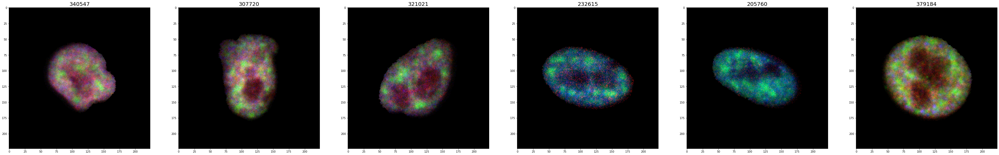

In [9]:
cells = {}
n_cells = len(params['cells'])
plt.figure(figsize=(n_cells*11,10))

for i, cell in enumerate(params['cells'], 1):
    temp_path = os.path.join(params['base_path'], 'Cells', cell+'.npz')
    temp_cell = np.load(temp_path)
    # Normalize cell
    cells[cell+'_img'] = copy.deepcopy(temp_cell['img'] / norm_vals)
    # filter accordingly to the input channels
    cells[cell+'_img'] = cells[cell+'_img'][:,:,input_ids].astype(np.float32)
    cells[cell+'_mask'] = copy.deepcopy(temp_cell['mask'])
    
    # Plot cells
    temp_img = (cells[cell+'_img'] / np.max(cells[cell+'_img'], axis=(0,1)))[:,:,10:13]
    plt.subplot(1, n_cells, i)
    nn_inter.plot_cell(img=temp_img, title=cell)

# 2.- Get Score Matrix for each cell (VarGrad IG)

# 2.2.- Load VarGrad IG

### Load Score Maps

In [12]:
VarGrad_IG = {}
for model in params['models_list']:
    print('Loading score maps from model ', model)
    temp_path_1 = os.path.join(params['base_path'], 'Score_maps', model)
    files = os.listdir(temp_path_1)
    # only load cells that match the prefix
    files = [f for f in files if f[0:len(params['prefix'])] == params['prefix']]
    # only load cells that match the selected ids
    files = [f for f in files if f[len(params['prefix'])+1:-4] in params['cells']]
    for f in files:
        print('\tLoading cell map ', f)
        temp_path_2 = os.path.join(temp_path_1, f)
        key = model+'_'+f[len(params['prefix'])+1:-4]
        VarGrad_IG[key] = np.load(temp_path_2)
    print("")

Loading score maps from model  BL_t1
	Loading cell map  Run_1_340547.npy
	Loading cell map  Run_1_205760.npy
	Loading cell map  Run_1_232615.npy
	Loading cell map  Run_1_307720.npy
	Loading cell map  Run_1_321021.npy
	Loading cell map  Run_1_379184.npy

Loading score maps from model  XC
	Loading cell map  Run_1_340547.npy
	Loading cell map  Run_1_205760.npy
	Loading cell map  Run_1_232615.npy
	Loading cell map  Run_1_307720.npy
	Loading cell map  Run_1_321021.npy
	Loading cell map  Run_1_379184.npy

Loading score maps from model  RN
	Loading cell map  Run_1_340547.npy
	Loading cell map  Run_1_205760.npy
	Loading cell map  Run_1_232615.npy
	Loading cell map  Run_1_307720.npy
	Loading cell map  Run_1_321021.npy
	Loading cell map  Run_1_379184.npy

Loading score maps from model  RN_t2
	Loading cell map  Run_1_340547.npy
	Loading cell map  Run_1_205760.npy
	Loading cell map  Run_1_232615.npy
	Loading cell map  Run_1_307720.npy
	Loading cell map  Run_1_321021.npy
	Loading cell map  Run_1_37

### Plote Score maps for both models and compare

In [13]:
params['cells']

['340547', '307720', '321021', '232615', '205760', '379184']

Plotting cell: 205760


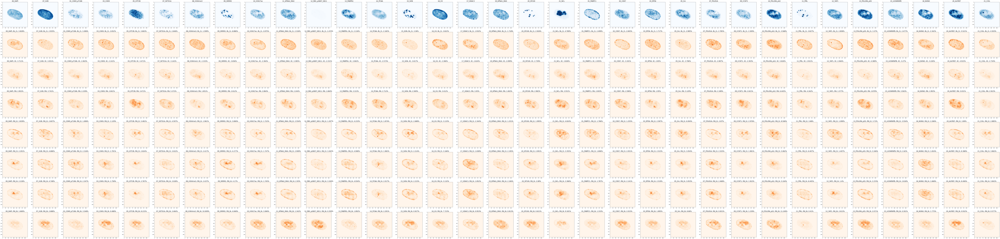

In [29]:
#for cell in params['cells']:
for cell in ['205760']:
    top_percent = 1
    plot_name = os.path.join(plot_dir, cell+'_'+str(top_percent)+'.jpg')
    print('Plotting cell: '+cell)
    temp_Score_maps = {key[:-7]: VarGrad_IG[key] for key in VarGrad_IG.keys() if cell in key}
    nn_inter.plot_VarGrad_IG_2(img=cells[cell+'_img'],
                               img_mask=cells[cell+'_mask'],
                               score_maps=temp_Score_maps,
                               top_percent=top_percent,
                               channels_df=channels_df,
                               img_size=(7,7),
                               score_map_same_sacale=False,
                               channels_2_plot=None,
                               plot_overlap=False,
                               plot_colorbar=False,
                               #plot_name=plot_name
                              )

# 3.- Comulative variance plot

In [15]:
mask = channels_df.channel_id.isin(input_ids)
channel_names = channels_df[mask].sort_values(by=['channel_id']).name.values

channel_stddev_df = pd.DataFrame()
for i, key in enumerate(VarGrad_IG.keys()):
    
    score_channel_std = []
    temp_score_map = VarGrad_IG[key]
    for c in range(temp_score_map.shape[-1]):
        score_channel_std.append(np.sum(temp_score_map[:,:,c]))
    total_stddev = np.sum(score_channel_std, axis=0)
        
    # Normalize the comulative stddev per channel
    for c in range(temp_score_map.shape[-1]):
        score_channel_std[c] /= total_stddev
    
    
    temp_df = pd.DataFrame(channel_names, columns=['channel_name'])
    temp_df['channel_var'] = score_channel_std
    temp_df['mapobject_id_cell'] = key[-6:]
    temp_df['Model'] = key[0:-7]
    
    channel_stddev_df = channel_stddev_df.append(temp_df, ignore_index=True)
channel_stddev_df

,channel_name,channel_var,mapobject_id_cell,Model
0,00_DAPI,0.039259,340547,BL_t1
1,07_H2B,0.029822,340547,BL_t1
2,01_CDK9_pT186,0.026906,340547,BL_t1
3,03_CDK9,0.028610,340547,BL_t1
4,05_GTF2B,0.035952,340547,BL_t1
...,...,...,...,...
1381,13_POL2RA_pS5,0.020852,379184,RN_t6
1382,15_U2SNRNPB,0.003173,379184,RN_t6
1383,18_NONO,0.020389,379184,RN_t6
1384,20_ALYREF,0.009515,379184,RN_t6


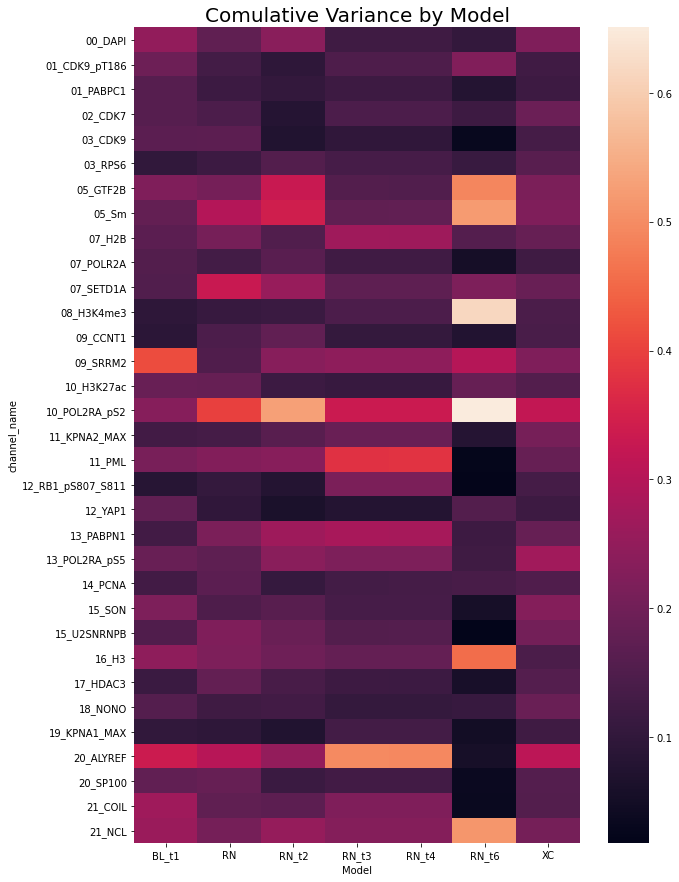

In [16]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name', 'Model']).sum().reset_index()
temp_df = temp_df.pivot('channel_name', 'Model', 'channel_var')
#temp_df = temp_df.sort_index(level=0, ascending=True)

plt.figure(figsize=(10,15))
sns.heatmap(temp_df)
_ = plt.title('Comulative Variance by Model', fontsize=20)

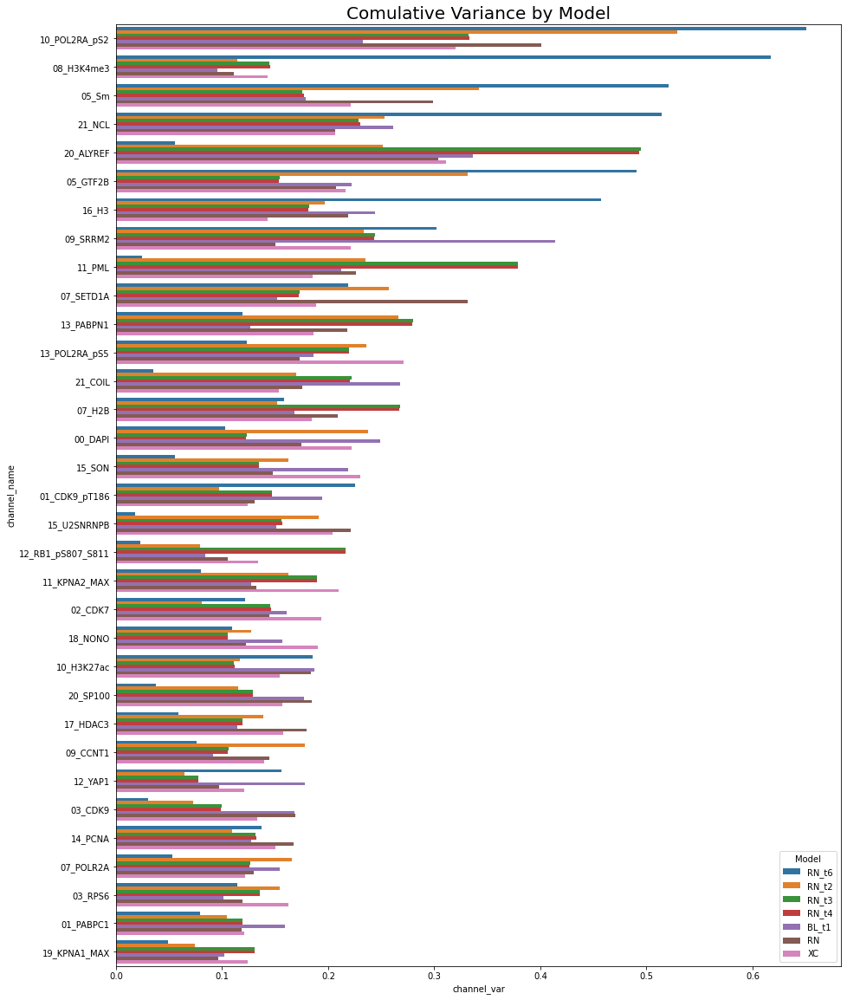

In [17]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name', 'Model']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var', 'Model'], ascending=False)
    
plt.figure(figsize=(15,20))
sns.barplot(
        data=temp_df,
        x="channel_var",
        y="channel_name",
        hue="Model",
        #hue_order=order,
        orient="h",
        #palette="viridis"
        )
_ = plt.title('Comulative Variance by Model', fontsize=20)

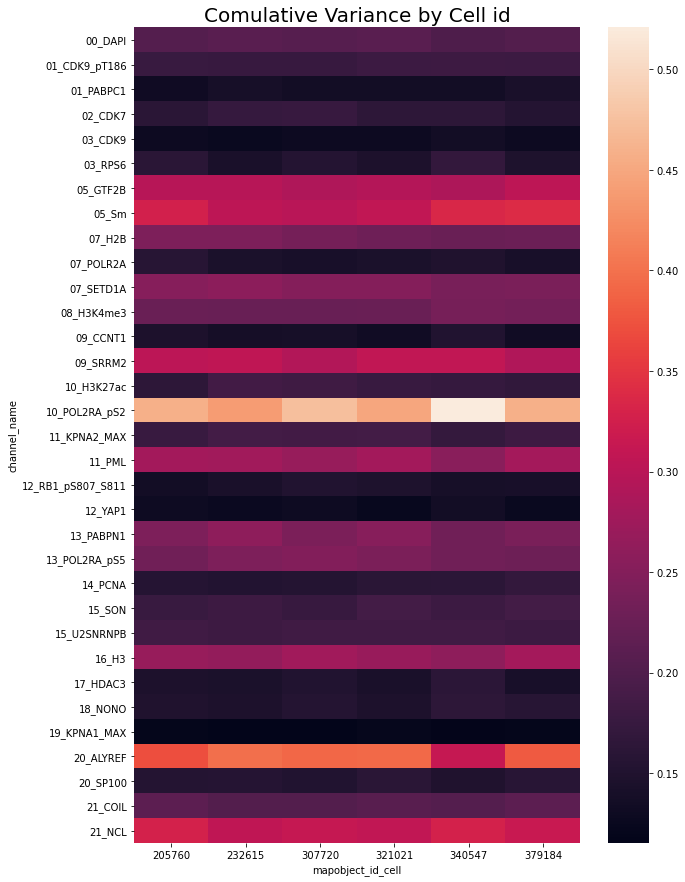

In [18]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name', 'mapobject_id_cell']).sum().reset_index()
temp_df = temp_df.pivot('channel_name', 'mapobject_id_cell', 'channel_var')
temp_df = temp_df.sort_index(level=0, ascending=True)


plt.figure(figsize=(10,15))
sns.heatmap(temp_df)
_ = plt.title('Comulative Variance by Cell id', fontsize=20)

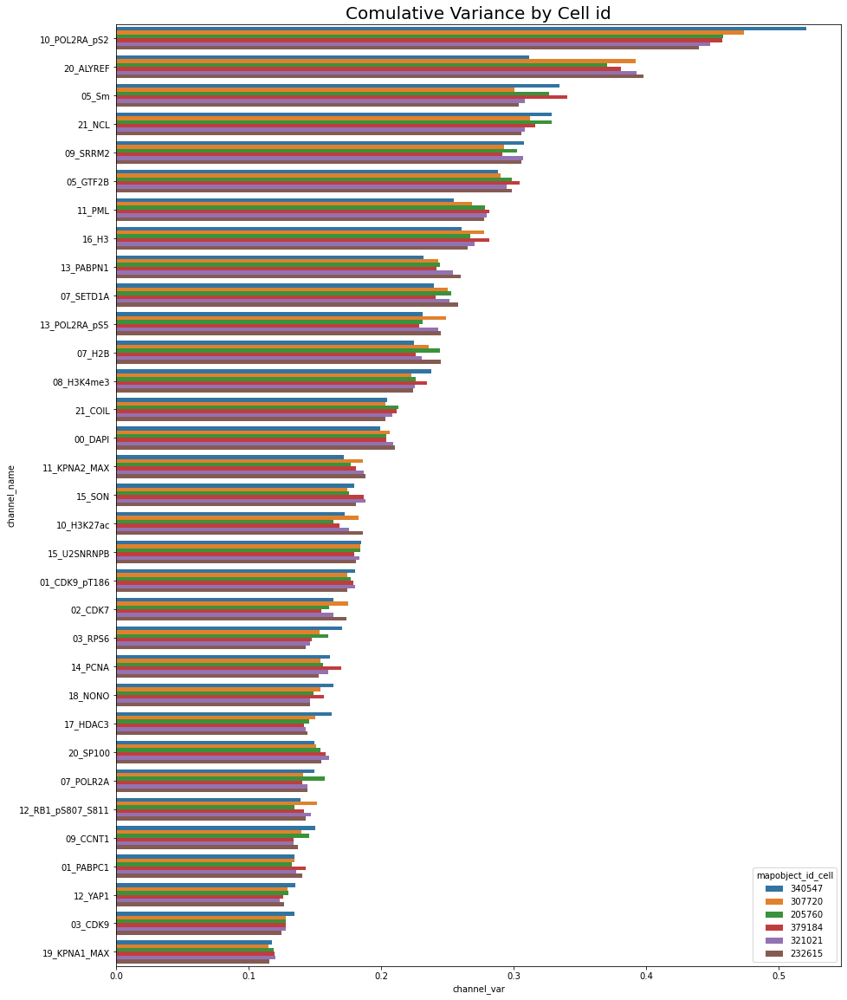

In [19]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name', 'mapobject_id_cell']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var', 'mapobject_id_cell'], ascending=False)
    
plt.figure(figsize=(15,20))
sns.barplot(
        data=temp_df,
        x="channel_var",
        y="channel_name",
        hue="mapobject_id_cell",
        #hue_order=order,
        orient="h",
        #palette="viridis"
        )
_ = plt.title('Comulative Variance by Cell id', fontsize=20)

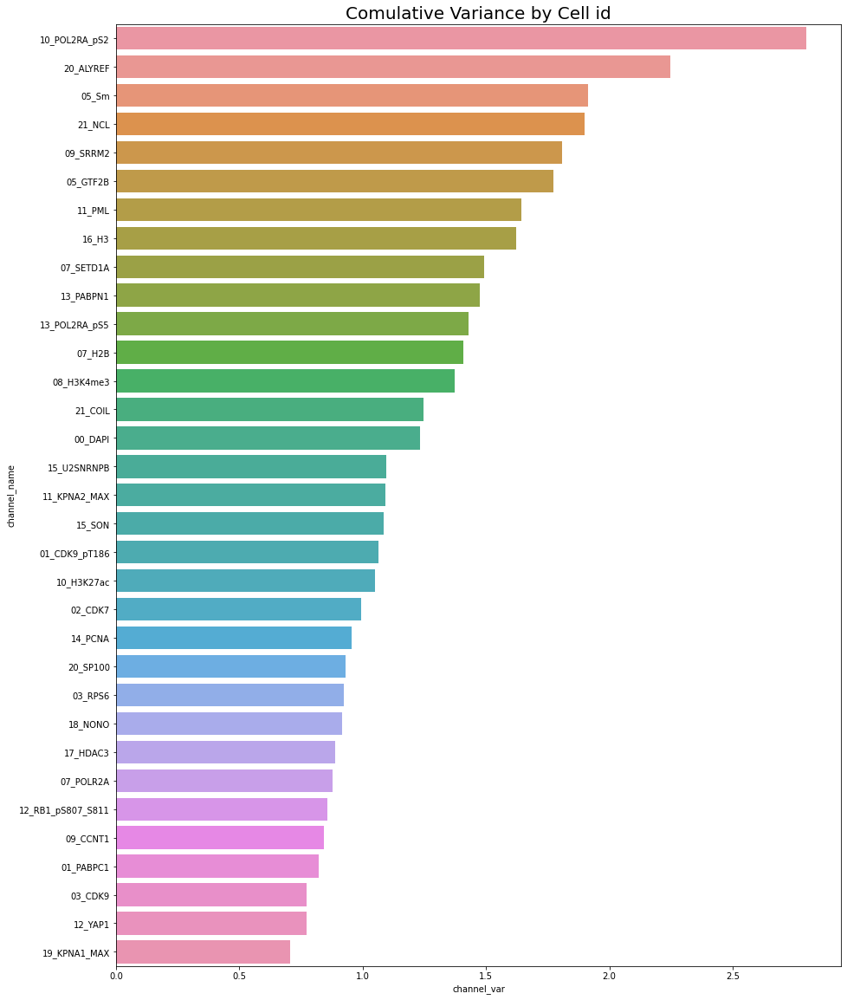

In [20]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False)
    
plt.figure(figsize=(15,20))
sns.barplot(
        data=temp_df,
        x="channel_var",
        y="channel_name",
        #hue_order=order,
        orient="h",
        #palette="viridis"
        )
_ = plt.title('Comulative Variance by Cell id', fontsize=20)

In [21]:
params['models_list']

['BL_t1', 'XC', 'RN', 'RN_t2', 'RN_t3', 'RN_t4', 'RN_t6']

In [22]:
mask = (channel_stddev_df.Model == 'BL_t1')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
21,07_POLR2A,0.025762,0.787882


In [23]:
mask = (channel_stddev_df.Model == 'XC')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
22,14_PCNA,0.024971,0.782703


In [24]:
mask = (channel_stddev_df.Model == 'RN')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
21,02_CDK7,0.024088,0.782276


In [25]:
mask = (channel_stddev_df.Model == 'RN_t2')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
19,07_H2B,0.025306,0.784117


In [26]:
mask = (channel_stddev_df.Model == 'RN_t3')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
21,14_PCNA,0.021934,0.792127


In [27]:
mask = (channel_stddev_df.Model == 'RN_t4')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
21,14_PCNA,0.022102,0.792261


In [28]:
mask = (channel_stddev_df.Model == 'RN_t6')
temp_df = channel_stddev_df[mask].copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df[temp_df.Cum_var < 0.8].tail(1)

,channel_name,channel_var,Cum_var
13,13_POL2RA_pS5,0.020596,0.792815


In [18]:
temp_df = channel_stddev_df.copy()
temp_df = temp_df.groupby(['channel_name']).sum().reset_index()
temp_df = temp_df.sort_values(by=['channel_var'], ascending=False).reset_index()
temp_df = temp_df.drop(['index'], axis=1)
total = np.sum(temp_df.channel_var)
temp_df.channel_var = (temp_df.channel_var / total)
temp_df['Cum_var'] = temp_df.channel_var.cumsum()

temp_df

,channel_name,channel_var,Cum_var
0,10_POL2RA_pS2,0.061755,0.061755
1,20_ALYREF,0.050123,0.111878
2,05_Sm,0.043364,0.155242
3,09_SRRM2,0.042445,0.197687
4,05_GTF2B,0.040709,0.238396
5,07_SETD1A,0.038731,0.277127
6,21_NCL,0.038635,0.315762
7,00_DAPI,0.036834,0.352597
8,13_POL2RA_pS5,0.036103,0.388700
9,11_PML,0.035798,0.424498
